# Functional Density Forecasting (FDF) Simulation

In [97]:
import numpy as np
import pandas as pd
from sklearn.model_selection import ParameterGrid

import joblib
import logging
from datetime import datetime
from pathlib import Path
from tqdm.auto import tqdm

import sys
sys.path.append('../')
import src.forecasting.simulations      as sim
import src.fda.plots                    as fplt
import src.fda.kde.estimators           as kde
import src.forecasting.cross_validation as crossVal

In [67]:
def format_records(measures, curves, metadata):
    records = []
    
    for m in measures:
        record = {
            **metadata,
            "fold": m["fold"] + 1,
            "KLD": m["KLD"],
            "JSD": m["JSD"],
            "L_1": m["L_1"],
            "L_2": m["L_2"],
            "L_INFTY": m["L_INFTY"],
            "curves": curves,
        }
        records.append(record)
        
    return records

In [85]:
EXECUTION_DATE : str = datetime.now().strftime('%Y%m%d')
LOG_PATH       : str = f'../logs/simulations/{EXECUTION_DATE}.log'
FILES_PATH     : str = f'../data/interim/simulation/{EXECUTION_DATE}/'

Path(FILES_PATH).mkdir(parents=True, exist_ok=True)

In [86]:
m = 1000
x = np.linspace(-0.05, 0.05, m)
u = np.linspace(0, 1, m)

In [87]:
pdf_normal = sim.generate_base_density(
                                       grid=x, 
                                       sigma=0.0067, 
                                       mu=0
                                       )
pdf_t      = sim.generate_base_density(
                                       grid=x, 
                                       kind='student_t', 
                                       df=4, 
                                       scale=0.0067*(1/np.sqrt(2))
                                       )

In [88]:
# Parameters
N_CURVES = 300
PHIS = [0.8, 0.5]
case_params = {
    'noise_type': "bb",
    'sigma': 0.05,
    'basis': "sine",
}

N_RETURNS    = int((60/5)*24)
EXAMPLE_DATE = 10

# Generate databases

## Dependent densities

In [89]:
sim_engine_n = sim.FDFSimulator(u_grid=u, x_grid=x)
sim_engine_n.run_simulation(
    base_pdf=pdf_normal, 
    n_curves=N_CURVES, 
    phis=PHIS,
    **case_params
    )
normal_densities = sim_engine_n.result["densities"]
sim_engine_n.plot_simulation()

<Axes: >

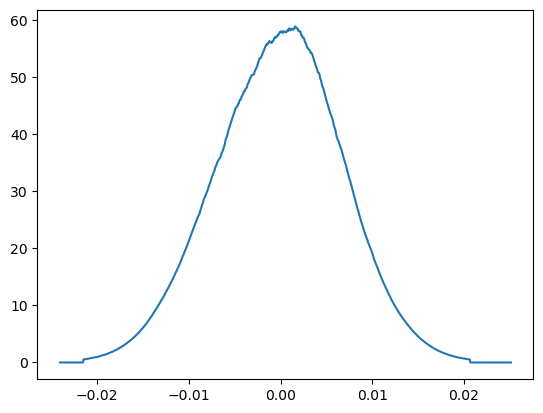

In [77]:
sim_engine_n.result["densities"]["2026-04-04"].plot()

In [28]:
sim_engine_t = sim.FDFSimulator(u_grid=u, x_grid=x)
sim_engine_t.run_simulation(
    base_pdf=pdf_t, 
    n_curves=N_CURVES, 
    phis=PHIS,
    **case_params
    )
student_densities = sim_engine_t.result["densities"]

sim_engine_t.plot_simulation()

## Returns sampled from simulated dependent densities

In [32]:
# Sample returns
returns_n = sim_engine_n.get_samples_df(n_samples=N_RETURNS)
returns_t = sim_engine_t.get_samples_df(n_samples=N_RETURNS)
returns_dfs = {
    "normal":  returns_n,
    "student": returns_t
    }

In [36]:
t_dfs = range(3,6)

# 1. Define the parameter universes for each method
rot_grid = {
    "method": ["rot"],
    "kernel": ["gaussian", "epanechnikov"], #"tophat", "exponential", "linear", "cosine"],
    "sigma_robust": [True, False]
}

lcv_sklearn_grid = {
    "method": ["cross_validate"],
    "kernel": ["gaussian"], #"epanechnikov"], #"tophat", "exponential", "linear", "cosine"],
    "cv": ["LOO"]#[5]
}

adaptive_grid = {
    "method": ["adaptive"], #"dpi"],
    "kernel": ["gaussian", "epanechnikov"],
    # "h": kernel_rules
}

lcv_t_grid = {
    "method": ["cross_validate"],
    "kernel": ["t-student"],
    "df": [df for df in t_dfs],
    "cv": ["LOO"]#, "LOO"] [5]
}

adaptive_grid_t = {
    "method": ["adaptive"], #"dpi"],
    "kernel": ["t-student"],
    "df": [df for df in t_dfs],
    # "h": kernel_rules
}

# 2. Combine grids and build the dictionary
density_param_grid = {}
for grid in [rot_grid, lcv_sklearn_grid, lcv_t_grid, adaptive_grid, adaptive_grid_t]:
    for params in ParameterGrid(grid):
        # Create a unique key based on the parameters
        # e.g., "rot_gaussian_robust_True" or "lcv_t-student_df_3"
        key_parts = [params["kernel"].replace("_","")]
        if "method" in params: key_parts.append(params["method"])
        if "df" in params: key_parts.append(f"df={params['df']}")
        if params.get("sigma_robust"): key_parts.append("robust")
        if params.get("cv") == "LOO": key_parts.append("loo")
        
        # ADD THESE TWO LINES:
        if "alpha" in params: key_parts.append(f"a{params['alpha']}")
        if "h" in params: key_parts.append(f"h{params['h']}") # Distinguish different pilot h values
        
        name = "_".join(key_parts).replace(".", "") # Remove dots for cleaner keys
        density_param_grid[name] = params

print("KDE models:")
for name, params in density_param_grid.items():
    print("\t",name, ":", params)

KDE models:
	 gaussian_rot_robust : {'kernel': 'gaussian', 'method': 'rot', 'sigma_robust': True}
	 gaussian_rot : {'kernel': 'gaussian', 'method': 'rot', 'sigma_robust': False}
	 epanechnikov_rot_robust : {'kernel': 'epanechnikov', 'method': 'rot', 'sigma_robust': True}
	 epanechnikov_rot : {'kernel': 'epanechnikov', 'method': 'rot', 'sigma_robust': False}
	 gaussian_cross_validate_loo : {'cv': 'LOO', 'kernel': 'gaussian', 'method': 'cross_validate'}
	 t-student_cross_validate_df=3_loo : {'cv': 'LOO', 'df': 3, 'kernel': 't-student', 'method': 'cross_validate'}
	 t-student_cross_validate_df=4_loo : {'cv': 'LOO', 'df': 4, 'kernel': 't-student', 'method': 'cross_validate'}
	 t-student_cross_validate_df=5_loo : {'cv': 'LOO', 'df': 5, 'kernel': 't-student', 'method': 'cross_validate'}
	 gaussian_adaptive : {'kernel': 'gaussian', 'method': 'adaptive'}
	 epanechnikov_adaptive : {'kernel': 'epanechnikov', 'method': 'adaptive'}
	 t-student_adaptive_df=3 : {'df': 3, 'kernel': 't-student', 'meth

In [40]:
# Basic dFPC setup
KdFPC_kwargs = {
    "p": 5
}

## dFPC estimation
dimensions_list = range(2,7)
print("Dimensions for dFPC:", len(dimensions_list))

## VAR lags
var_qs = range(1,5)
print("Lags for VAR(q):", len(var_qs))

Dimensions for dFPC: 5
Lags for VAR(q): 4


In [ ]:
total_params = (len(returns_dfs) * len(density_param_grid) * len(dimensions_list) * len(var_qs))
pbar = tqdm(total=total_params, desc="Total CV Progress")

INITIAL_CV_WINDOW = 299
CV_END = 300

all_records = []
for database_name, database in returns_dfs.items():
    returns_df = returns_dfs[database_name]
    returns_df_validation_set = returns_df.iloc[:,:CV_END]

    for kde_model_name, kde_model_params in density_param_grid.items():
        print(f"Processing configuration: {name}")
        
        # bandwidths
        df_h = kde.df_bandwidth_selector(returns_df_validation_set, **kde_model_params)    
        kde_params = {k: v for k, v in kde_model_params.items() if k in ['kernel', 'df']}
        
        # kdes
        df_support, df_densities = kde.df_to_kde(
            X=returns_df_validation_set, 
            h=df_h, 
            normalize_densities=False,
            **kde_params
        )
        # dFPC components
        for d in dimensions_list:
            KdFPC_kwargs.update(
                {"dimension": d}
                )

            # VAR(q) lags
            for q in var_qs:
                full_model_name = '__'.join([kde_model_name, str(d), str(q)])
                try:
                    cv_fpc_measures, dfpc_cv_curves = crossVal.cv(
                                    df_densities, 
                                    df_support, 
                                    KdFPC_kwargs = KdFPC_kwargs, 
                                    var_lags=q, 
                                    initial_window=INITIAL_CV_WINDOW,
                                    return_curves=True
                                    )

                except Exception as e:
                    print(f"\t ERROR for d={d} and {params} : {e}")
                    # logger.exception(f"\t ERROR for d={d} and {params} : {e}")
                    continue
                
                metadata = {
                    "database_name": database_name,
                    "full_model_name": full_model_name,
                    "kde_params": name,
                    "dFPC_dimensions": d,
                    "VAR_q": q
                }

                records = format_records(cv_fpc_measures, dfpc_cv_curves, metadata)
                all_records.extend(records)
                df_mdfpc_records = pd.DataFrame(records)
                joblib.dump(df_mdfpc_records, f'../data/interim/simulation/{EXECUTION_DATE}/{full_model_name}.jbl', compress=3)

                pbar.update(1)

df_cv = pd.DataFrame(all_records)

Total CV Progress:   0%|          | 0/520 [00:00<?, ?it/s]

Processing configuration: epanechnikov_rot
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
		>>> cv 1/1
Processing configuration: epanechnikov_rot


In [94]:
df_cv = pd.DataFrame(all_records)
df_cv

,database_name,full_model_name,kde_params,dFPC_dimensions,VAR_q,fold,KLD,JSD,L_1,L_2,L_INFTY,curves
0,normal,gaussian_rot_robust__2__1,epanechnikov_rot,2,1,1,0.053526,0.003766,11447.189708,240.291110,8.379622,actual forecast ...
1,normal,gaussian_rot_robust__2__2,epanechnikov_rot,2,2,1,0.056700,0.003911,11805.806160,245.293839,8.602304,actual forecast ...
2,normal,gaussian_rot_robust__2__3,epanechnikov_rot,2,3,1,0.051766,0.003667,11449.459481,235.254193,8.165661,actual forecast ...
3,normal,gaussian_rot_robust__2__4,epanechnikov_rot,2,4,1,0.049878,0.003576,11216.075445,231.841463,8.022473,actual forecast ...
4,normal,gaussian_rot_robust__3__1,epanechnikov_rot,3,1,1,0.051682,0.003469,11141.308024,232.065561,8.196185,actual forecast ...
...,...,...,...,...,...,...,...,...,...,...,...,...
115,normal,t-student_cross_validate_df=3_loo__5__4,epanechnikov_rot,5,4,1,0.037254,0.002794,10019.995854,202.325211,7.695913,actual forecast ...
116,normal,t-student_cross_validate_df=3_loo__6__1,epanechnikov_rot,6,1,1,0.045594,0.003344,10588.381063,223.690646,8.926968,actual forecast ...
117,normal,t-student_cross_validate_df=3_loo__6__2,epanechnikov_rot,6,2,1,0.048616,0.003486,11014.630324,228.508159,9.137200,actual forecast ...
118,normal,t-student_cross_validate_df=3_loo__6__3,epanechnikov_rot,6,3,1,0.034402,0.002572,9410.220187,194.428323,7.458406,actual forecast ...


<Axes: xlabel='fold,date,support'>

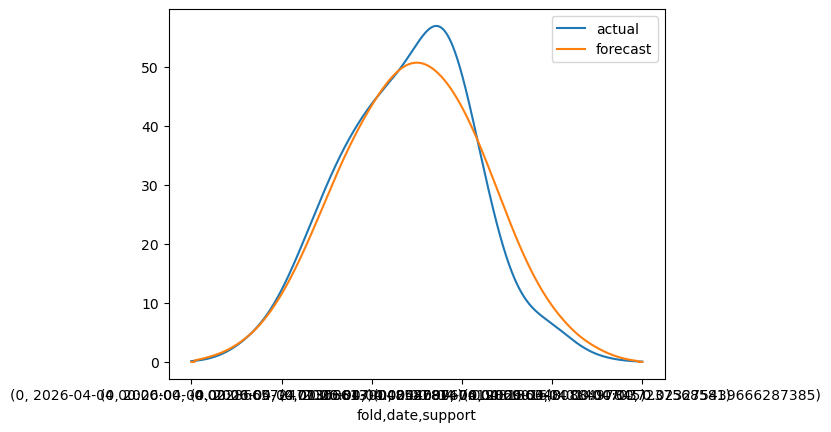

In [81]:
df_cv.iloc[0,7].plot()